# 🌸🌷🌹🌻꽃 다중 분류🌺💐🌼🥀🪻

## Step 1. 데이터셋 내려받기


In [1]:
# tensorflow 버전 확인
import tensorflow_datasets as tfds

tfds.__version__

'4.9.8'

* Dataset Download
https://www.tensorflow.org/datasets/catalog/tf_flowers

In [2]:
# 구글 드라이브 마운트
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# 데이터셋 불러오기 맟 저장 & 데이터 분할
import tensorflow_datasets as tfds

# Google Drive 내 저장
data_dir = '/content/drive/MyDrive/tfds/flowers'

# 데이터셋 로드 (tf_flowers 예시)
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir=data_dir,
    with_info=True,
    as_supervised=True
)

In [4]:
# 데이터셋 확인
print(raw_train)
print(raw_validation)
print(raw_test)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [5]:
# 클래스 이름 출력
print(metadata.features['label'].names)

['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']


In [6]:
y_train = [label.numpy() for image, label in raw_train]
y_val = [label.numpy() for image, label in raw_validation]
y_test = [label.numpy() for image, label in raw_test]

In [7]:
# 클래스 이름 정의
classes = metadata.features['label'].names

# 클래스별 개수를 세기 위한 함수
def get_numbers(labels, target):
    return sum([1 for label in labels if label == target])

# 클래스별 train/val/test 개수 출력
print(f"Class\t\tTrain\tVal\tTest\n")
for i, cls in enumerate(classes):
    print(f"{cls:10}\t{get_numbers(y_train, i)}\t{get_numbers(y_val, i)}\t{get_numbers(y_test, i)}")

Class		Train	Val	Test

dandelion 	739	89	70
daisy     	513	59	61
tulips    	613	101	85
sunflowers	561	62	76
roses     	510	56	75


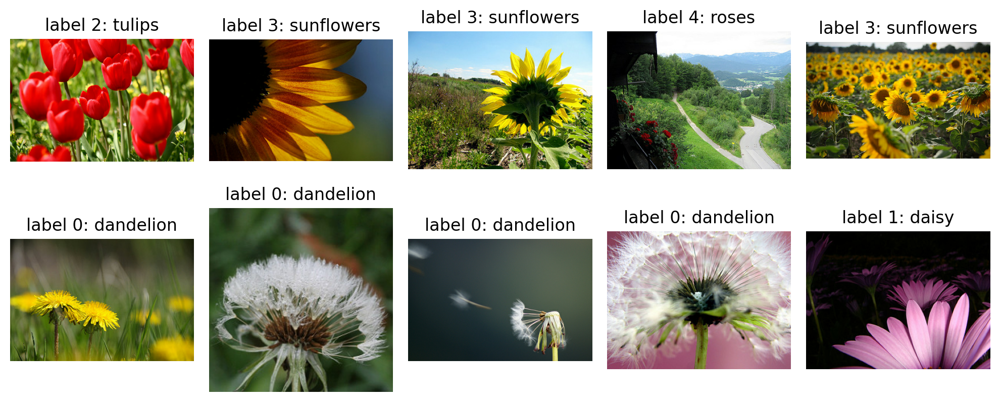

In [8]:
# 이미지 확인
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')
    plt.tight_layout()



* label 0 : dandelion
* label 1 : daisy 🌼
* label 2: tuplips 🌷
* label 3: sunflowers 🌻
* label 4: roses🌹


## Step 2. 데이터셋을 모델에 넣을 수 있는 형태로 준비하기

In [9]:
# 이미지 크기 동일 및 픽셀 정규화
IMG_SIZE = 160

def format_example(image, label):
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)
print("완료")

완료


In [10]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


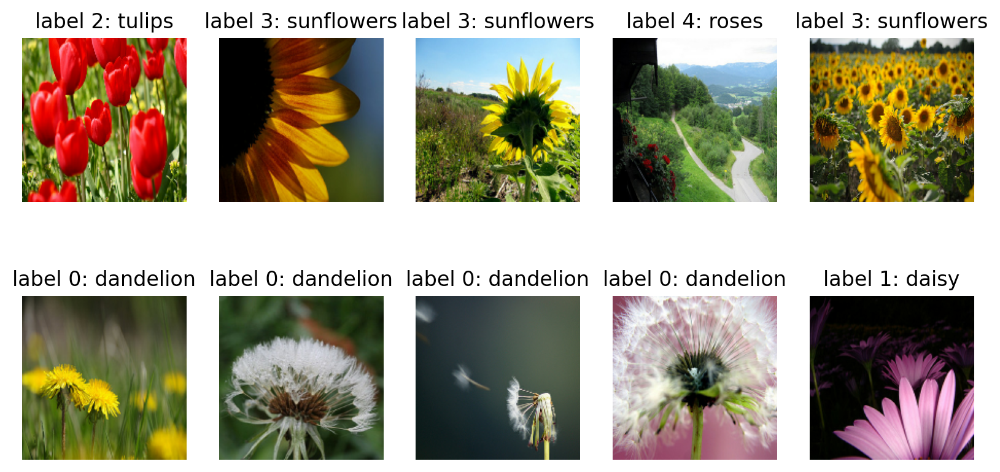

In [11]:
# 이미지 출력
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

# Step 3. 모델 설계하기

In [12]:
# conv2 모델 그대로 사용하기
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

print("완료")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


완료


In [13]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 160, 160, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 80, 80, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 80, 80, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 40, 40, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 40, 40, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 20, 20, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │      13,107,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 5)                   │           2,565 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,133,861 (50.10 MB)

 Trainable params: 13,133,861 (50.10 MB)

 Non-trainable params: 0 (0.00 B)

## Step 4. 모델 학습시키기

In [14]:
# 모델 컴파일
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [15]:
# Batch size 및 random 설정
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [16]:
# train_batches/ validation_batches / test_batches 준비
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [17]:
# 이미지와 라벨의 텐서 크기를 확인
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [18]:
# 검증 데이터를 repeat() 처리하여 반복적으로 사용할 수 있게 함
validation_batches_repeat = validation_batches.repeat()

# 초기 모델 성능 확인
validation_steps = 20  # 평가에 사용할 validation 배치 수
loss0, accuracy0 = model.evaluate(validation_batches_repeat, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - accuracy: 0.2006 - loss: 1.6015
initial loss: 1.60
initial accuracy: 0.19


In [19]:
# 모델 학습
EPOCHS = 15
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step - accuracy: 0.3349 - loss: 1.4789 - val_accuracy: 0.4741 - val_loss: 1.1627
Epoch 2/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.5550 - loss: 1.0841 - val_accuracy: 0.5804 - val_loss: 1.0172
Epoch 3/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.6258 - loss: 0.9546 - val_accuracy: 0.6240 - val_loss: 0.9859
Epoch 4/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.6827 - loss: 0.8484 - val_accuracy: 0.6349 - val_loss: 0.9725
Epoch 5/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.7137 - loss: 0.7530 - val_accuracy: 0.6458 - val_loss: 0.9387
Epoch 6/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.7876 - loss: 0.6345 - val_accuracy: 0.6349 - val_loss: 0.9397
Epoch 7/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.8045 - loss: 0.5764 - val_accuracy: 0.6131 - val_loss: 1.0134
Epoch 8/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.8232 - loss: 0.4966 - val_accuracy: 0.6458 - v

너무 낮음 ㅠㅠ

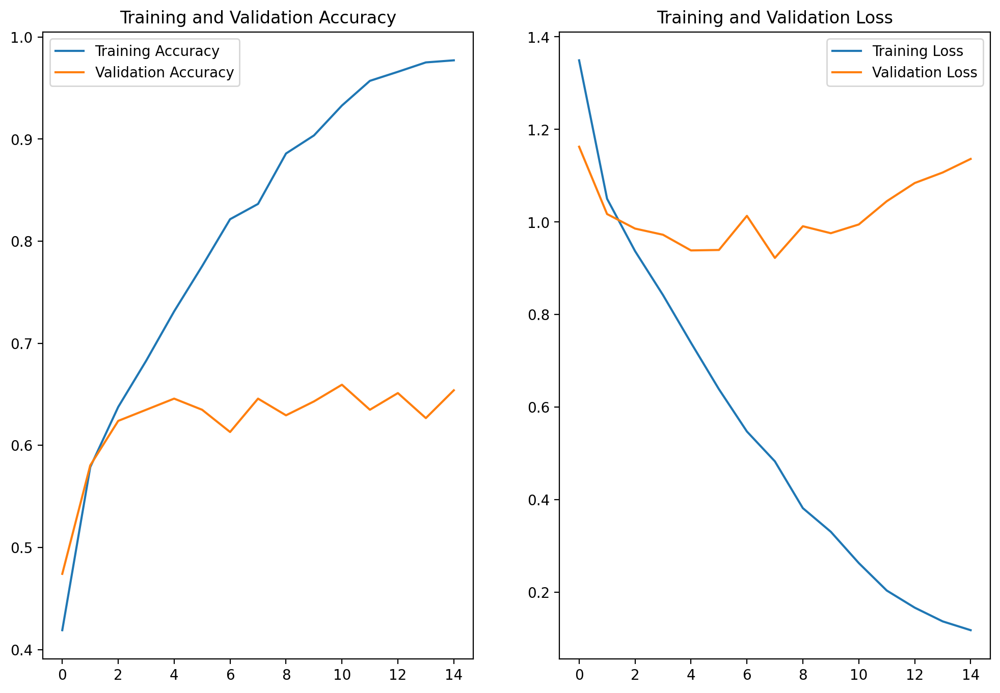

In [20]:
# 그래프 출력
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [21]:
# 테스트 데이터셋에서 하나의 배치를 가져와 예측을 수행
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


array([[1.09596454e-04, 6.32578440e-06, 8.74264300e-01, 2.07519755e-02,
        1.04867801e-01],
       [9.48972344e-01, 4.99316268e-02, 1.00981549e-03, 6.67911365e-07,
        8.56926054e-05],
       [6.85332417e-01, 8.61169957e-03, 2.39910722e-01, 6.50563017e-02,
        1.08888547e-03],
       [2.39386503e-02, 4.46045101e-01, 3.85259390e-01, 4.01289947e-03,
        1.40743941e-01],
       [9.64091122e-01, 2.84645278e-02, 2.95203784e-03, 9.45599342e-04,
        3.54664726e-03],
       [4.04557914e-01, 8.07836726e-02, 4.40566778e-01, 5.55288221e-04,
        7.35363811e-02],
       [1.34022487e-03, 8.02721024e-01, 1.92468062e-01, 4.45268670e-04,
        3.02536646e-03],
       [6.30036592e-01, 9.79620814e-02, 9.11416709e-02, 1.99695192e-02,
        1.60890102e-01],
       [5.86976344e-03, 1.48809602e-06, 1.88214285e-03, 9.92226958e-01,
        1.96725923e-05],
       [9.94903684e-01, 4.18865215e-03, 1.05384745e-04, 5.14183455e-07,
        8.01803253e-04],
       [9.98783886e-01, 1.8915

In [22]:
# 예측 결과를 클래스 번호로 출력
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 1, 0, 2, 1, 0, 3, 0, 0, 0, 3, 4, 4, 3, 2, 0, 0, 2, 2, 0,
       2, 0, 1, 0, 2, 1, 2, 1, 0, 0])

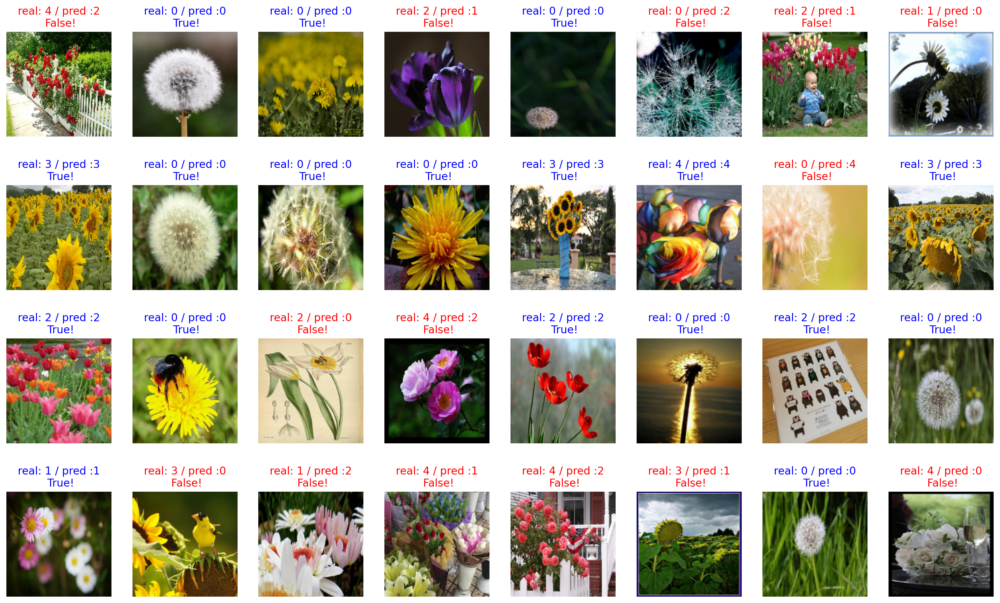

In [23]:
# 그래프 출력
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [24]:
# 정답의 비율
count = 0
for image, label, prediction in zip(images, labels, predictions):
    if label == prediction:
        count += 1

print(count / 32 * 100)

56.25


정확도가 낮기 때문에 전이 학습 시도 !! 모델도 빠꿔서 시도해 보자 !!

In [25]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import Input

# 이미지 크기 설정
IMG_SIZE = 160
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# EfficientNetB0 base model 로드
base_model = EfficientNetB0(input_shape=IMG_SHAPE,
                            include_top=False,
                            weights='imagenet')

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [26]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [27]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 1280])

In [28]:
base_model.summary()

Model: "efficientnetb0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 160, 160, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 160, 160, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 160, 160, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_1 (Rescaling)   │ (None, 160, 160, 3)    │              0 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 161, 161, 3)    │              0 │ rescaling_1[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 80, 80, 32)     │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 80, 80, 32)     │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 80, 80, 32)     │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 80, 80, 32)     │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 80, 80, 32)     │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 80, 80, 32)     │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 4,049,571 (15.45 MB)

 Trainable params: 4,007,548 (15.29 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [29]:
inputs = tf.keras.Input(shape=(160, 160, 3))
x = base_model(inputs, training=False)  # Feature extractor
x = tf.keras.layers.GlobalAveragePooling2D()(x)

x = tf.keras.layers.Dense(512)(x)
x = tf.keras.layers.BatchNormalization()(x)  # Dense층 이후에 batch 정규화 추가
x = tf.keras.layers.Activation('relu')(x)  #  활성화 함수 따로 사용
x = tf.keras.layers.Dropout(0.4)(x)

outputs = tf.keras.layers.Dense(5, activation='softmax')(x)
model = tf.keras.Model(inputs, outputs)

In [30]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 160, 160, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb0 (Functional)          │ (None, 5, 5, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 5)                   │           2,565 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,710,056 (17.97 MB)

 Trainable params: 4,667,009 (17.80 MB)

 Non-trainable params: 43,047 (168.16 KB)

In [31]:
from tensorflow.keras.callbacks import EarlyStopping
# 조기 종료 콜백 정의
early_stop = EarlyStopping(
    monitor='val_accuracy',
    patience=4,
    restore_best_weights=True,
    min_delta=0.001,
    verbose=1
)

In [32]:
# 모델 컴파일
learning_rate = 0.0001
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
    loss=tf.keras.losses.sparse_categorical_crossentropy,
    metrics=['accuracy']
)

In [33]:
# 모델의 초기성능 확인
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 ━━━━━━━━━━━━━━━━━━━━ 16s 272ms/step - accuracy: 0.1484 - loss: 1.6281
initial loss: 1.63
initial accuracy: 0.15


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


In [34]:
# 모델 학습
EPOCHS = 15
history = model.fit(
    train_batches,
    epochs=EPOCHS,
    validation_data=validation_batches,
    callbacks=[early_stop]
)

Epoch 1/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 127s 511ms/step - accuracy: 0.4529 - loss: 1.4343 - val_accuracy: 0.1771 - val_loss: 1.6323
Epoch 2/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8368 - loss: 0.4535 - val_accuracy: 0.2752 - val_loss: 1.6209
Epoch 3/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8806 - loss: 0.3300 - val_accuracy: 0.3842 - val_loss: 1.4618
Epoch 4/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.9208 - loss: 0.2260 - val_accuracy: 0.6104 - val_loss: 0.9913
Epoch 5/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.9414 - loss: 0.1552 - val_accuracy: 0.7275 - val_loss: 0.7532
Epoch 6/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.9638 - loss: 0.1197 - val_accuracy: 0.8147 - val_loss: 0.5027
Epoch 7/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.9669 - loss: 0.0979 - val_accuracy: 0.8719 - val_loss: 0.3739
Epoch 8/15
92/92 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9822 - loss: 0.0611 - val_accuracy: 0.8338 

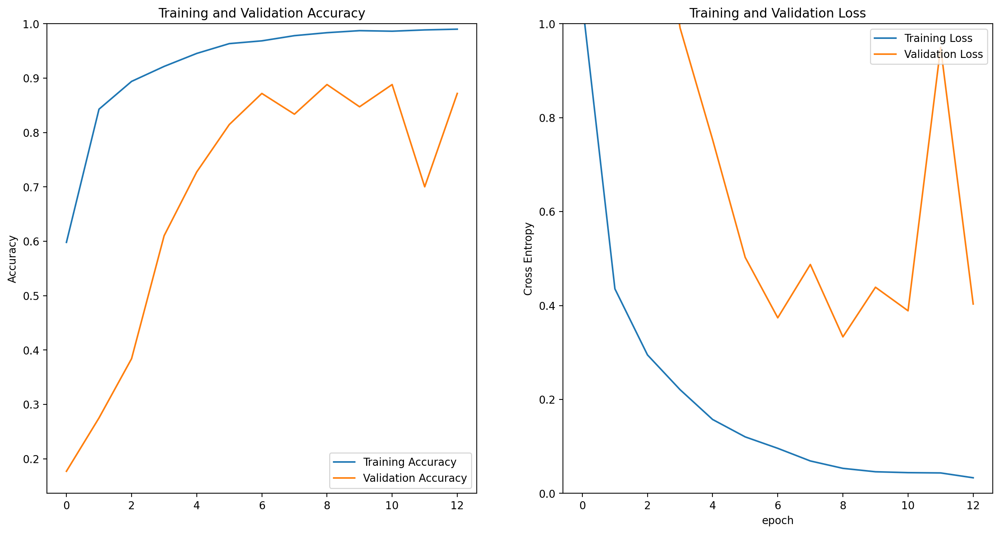

In [35]:
# 그래프 출력
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [36]:
# 테스트 데이터셋에서 하나의 배치를 가져와 예측을 수행
for image_batch, label_batch in test_batches.take(4):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


array([[3.44605907e-03, 3.45820881e-05, 1.45482436e-05, 9.96504426e-01,
        3.34855542e-07],
       [2.11961978e-05, 5.99131628e-04, 3.41343194e-01, 6.57959998e-01,
        7.65030782e-05],
       [6.45486591e-03, 8.15746607e-04, 2.79402792e-01, 8.08214620e-02,
        6.32505119e-01],
       [5.71696877e-01, 1.87196761e-01, 2.19989941e-02, 1.17886346e-02,
        2.07318649e-01],
       [2.86011368e-01, 1.90753676e-02, 6.63084618e-04, 6.93903804e-01,
        3.46361776e-04],
       [2.71891177e-01, 1.01536773e-02, 2.99652040e-01, 3.59271020e-02,
        3.82376015e-01],
       [3.13275200e-06, 3.19161927e-06, 3.19807896e-06, 1.76200756e-05,
        9.99972820e-01],
       [1.11942099e-05, 2.95508380e-05, 1.11028960e-03, 5.92249035e-06,
        9.98842955e-01],
       [6.26945848e-07, 8.47922763e-07, 9.99131739e-01, 8.66811490e-04,
        8.21394508e-09],
       [9.88403738e-01, 4.33173822e-03, 2.54189828e-03, 3.56655288e-03,
        1.15615781e-03],
       [2.61620060e-03, 6.9599

In [37]:
# 예측 결과를 클래스 번호로 출력
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([3, 3, 4, 0, 3, 4, 4, 4, 2, 0, 3, 4, 2, 1, 2, 4, 2, 1, 4, 0, 4, 0,
       1, 4, 4, 1, 4, 2, 2, 2, 3, 0])

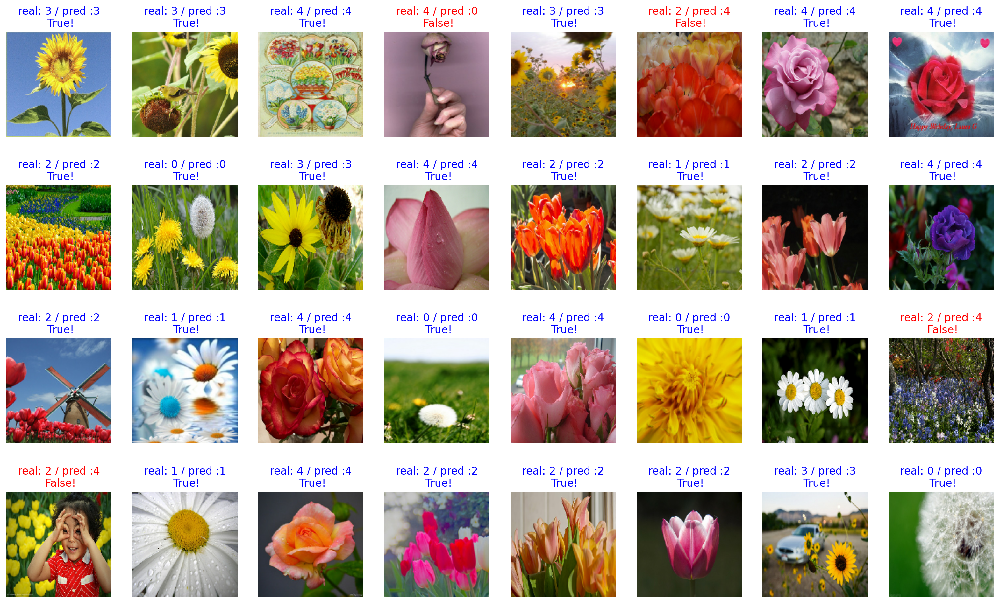

In [38]:
# 예측 결과 시각화
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [39]:
# 테스트셋에서 모델 평가 (테스트 정확도 출력)
test_loss, test_accuracy = model.evaluate(test_batches)

print(f"테스트 손실 (Loss): {test_loss:.4f}")
print(f"테스트 정확도 (Accuracy): {test_accuracy:.4f}")

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.8631 - loss: 0.4291
테스트 손실 (Loss): 0.3955
테스트 정확도 (Accuracy): 0.8719


In [40]:
from sklearn.metrics import classification_report
import numpy as np

# 1. 테스트셋에서 이미지와 라벨 가져오기 (Batch가 여러 개일 수 있으므로 모두 합침)
test_images = []
test_labels = []

for img_batch, label_batch in test_batches:
    test_images.extend(img_batch)
    test_labels.extend(label_batch)

# numpy 배열로 변환
test_images = np.array(test_images)
test_labels = np.array(test_labels)

# 2. 예측 수행
pred_probs = model.predict(test_images)
pred_labels = np.argmax(pred_probs, axis=1)  # 예측 클래스 라벨

# 3. classification_report 출력
from sklearn.metrics import classification_report

print(classification_report(test_labels, pred_labels, target_names=metadata.features['label'].names))

12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 647ms/step
              precision    recall  f1-score   support

   dandelion       0.85      0.97      0.91        70
       daisy       0.91      0.84      0.87        61
      tulips       0.80      0.87      0.83        85
  sunflowers       0.99      0.88      0.93        76
       roses       0.86      0.80      0.83        75

    accuracy                           0.87       367
   macro avg       0.88      0.87      0.87       367
weighted avg       0.88      0.87      0.87       367



## Step 5. 모델 저장하기

In [60]:
model.save('/content/drive/MyDrive/tfds/flowers/final_model.keras')

In [42]:
# # Drive에 저장할 경로 (원하는 폴더 경로로 수정 가능)
# !cp best_model.h5 /content/drive/MyDrive/tfds/flowers/my_flower_model.h5

위에서 학습하면서 모델을 저장했지만 런타임 해제시 사라지기 때문에 구글 드라이브에 영구 저장

In [61]:
from tensorflow.keras.models import load_model

# 구글 드라이브 경로에서 모델 불러오기
model_path = '/content/drive/MyDrive/tfds/flowers/final_model.keras'
model = load_model(model_path)

print("✅ 모델 불러오기 완료!")

✅ 모델 불러오기 완료!


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 436 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


## Step 6. 모델 활용하기

In [62]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [63]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.utils import load_img, img_to_array
import os

# 클래스 이름 순서
class_names = ['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']

def show_and_predict_flower(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))

    # 이미지 시각화
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Image: {filename}")
    plt.show()

    # 정규화 및 차원 변경
    image = img_to_array(image)
    image = (image / 127.5) - 1   # ✅ 정규화 추가
    image = np.expand_dims(image, axis=0)

    # 예측
    prediction = model.predict(image)[0]

    # 클래스별 확률 출력
    print(f"\nThis image seems to be:")
    for i, prob in enumerate(prediction):
        print(f"{class_names[i]:10}: {prob*100:.2f}%")

    # ✅ 가장 높은 확률의 클래스 출력
    predicted_index = np.argmax(prediction)
    predicted_label = class_names[predicted_index]
    confidence = prediction[predicted_index] * 100
    print(f"\n✅ 최종 예측: {predicted_label.upper()} ({confidence:.2f}%)")

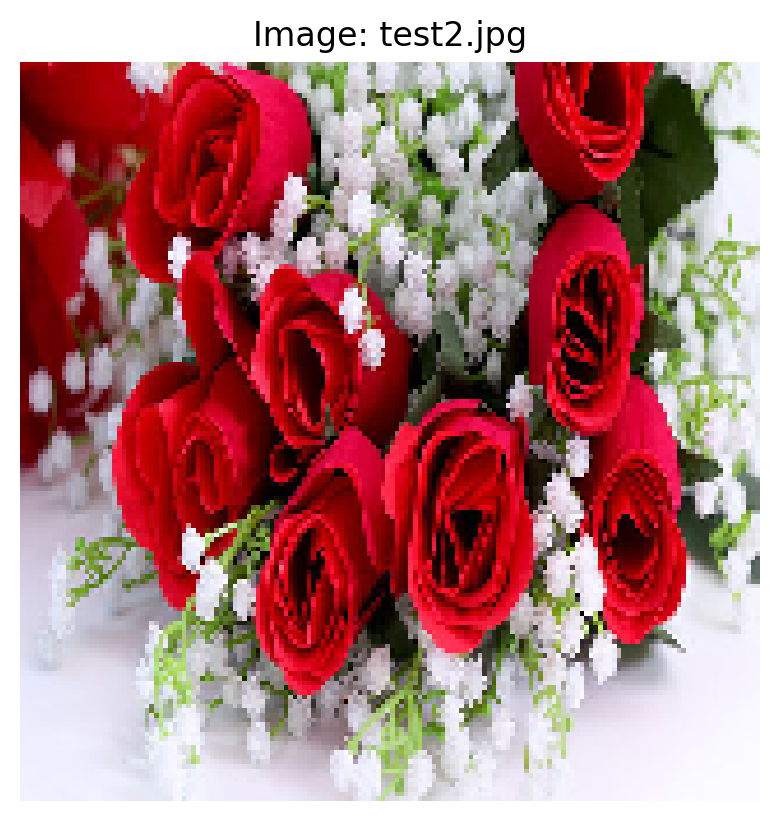

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step

This image seems to be:
dandelion : 0.00%
daisy     : 0.01%
tulips    : 0.70%
sunflowers: 0.01%
roses     : 99.29%

✅ 최종 예측: ROSES (99.29%)


In [64]:
import os
import matplotlib.pyplot as plt
show_and_predict_flower('/content', 'test2.jpg')

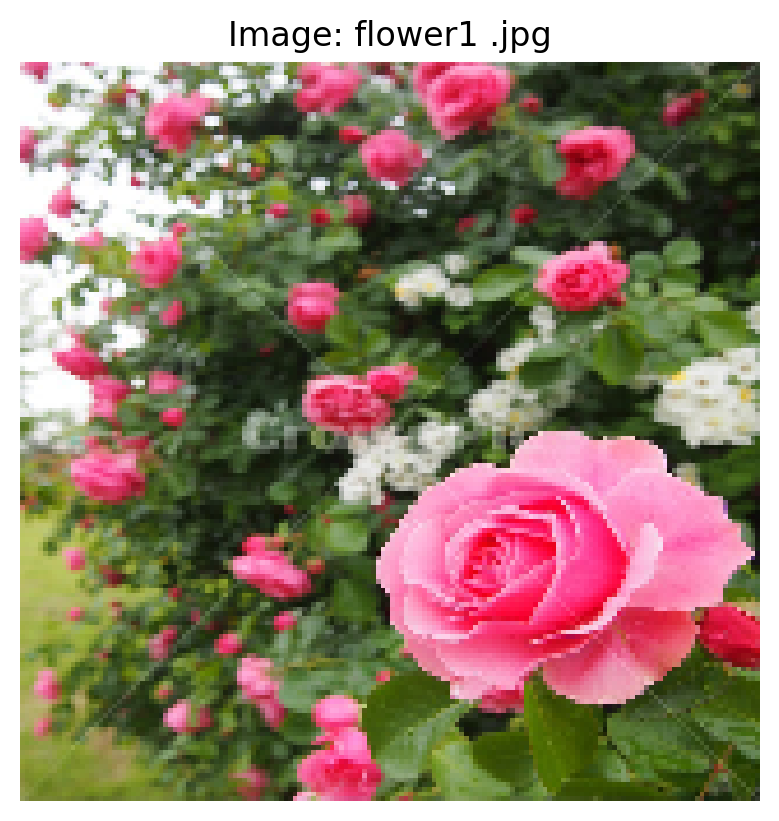

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

This image seems to be:
dandelion : 0.00%
daisy     : 0.00%
tulips    : 0.00%
sunflowers: 0.00%
roses     : 100.00%

✅ 최종 예측: ROSES (100.00%)


In [65]:
show_and_predict_flower('/content', 'flower1 .jpg')

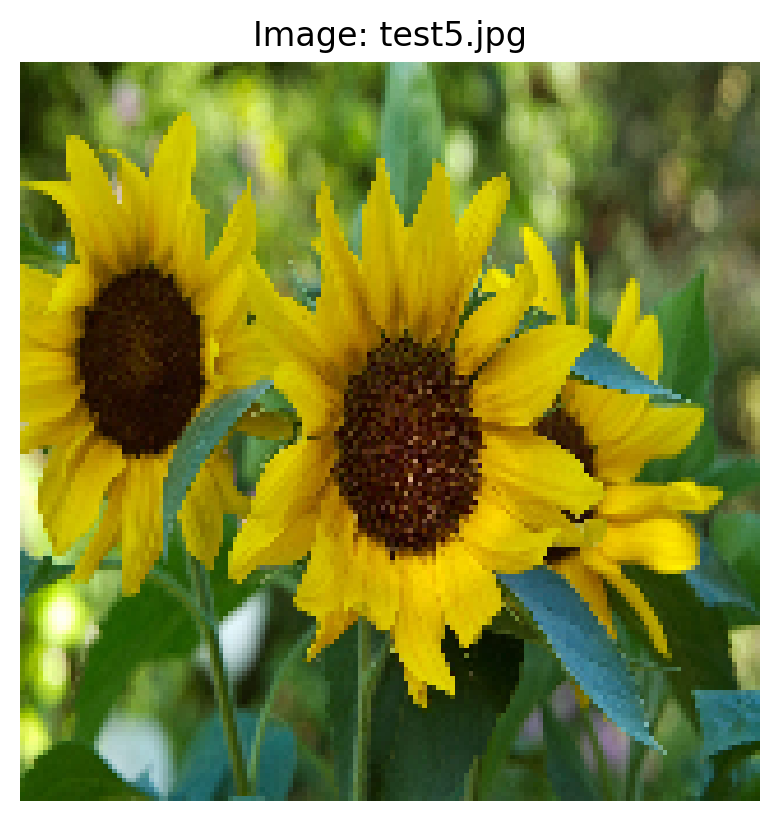

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step

This image seems to be:
dandelion : 0.04%
daisy     : 0.03%
tulips    : 1.15%
sunflowers: 98.76%
roses     : 0.03%

✅ 최종 예측: SUNFLOWERS (98.76%)


In [66]:
show_and_predict_flower('/content', 'test5.jpg')

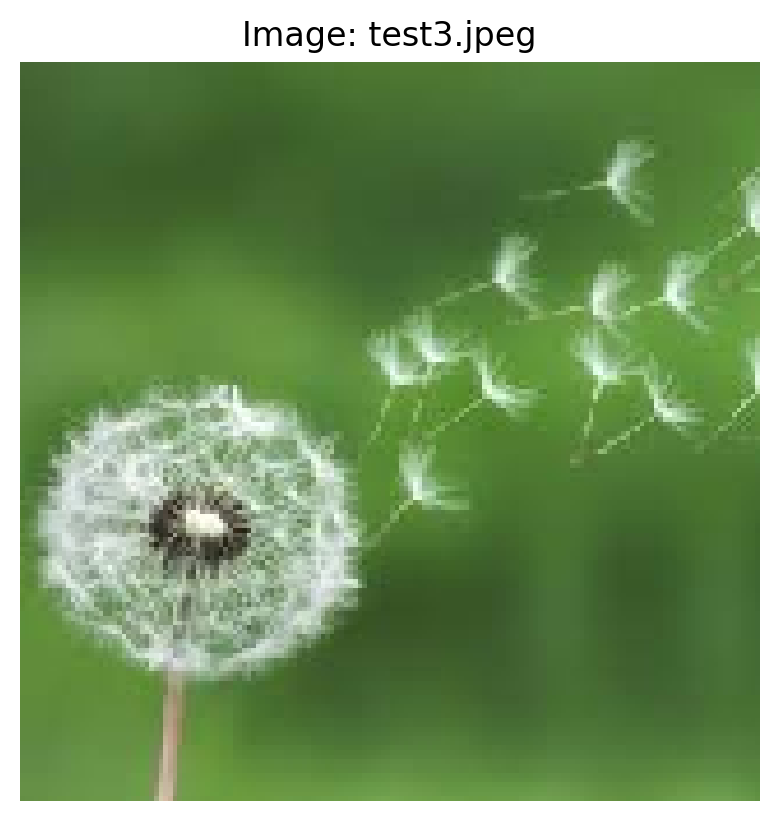

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step

This image seems to be:
dandelion : 95.10%
daisy     : 4.05%
tulips    : 0.08%
sunflowers: 0.24%
roses     : 0.53%

✅ 최종 예측: DANDELION (95.10%)


In [69]:
show_and_predict_flower('/content', 'test3.jpeg')

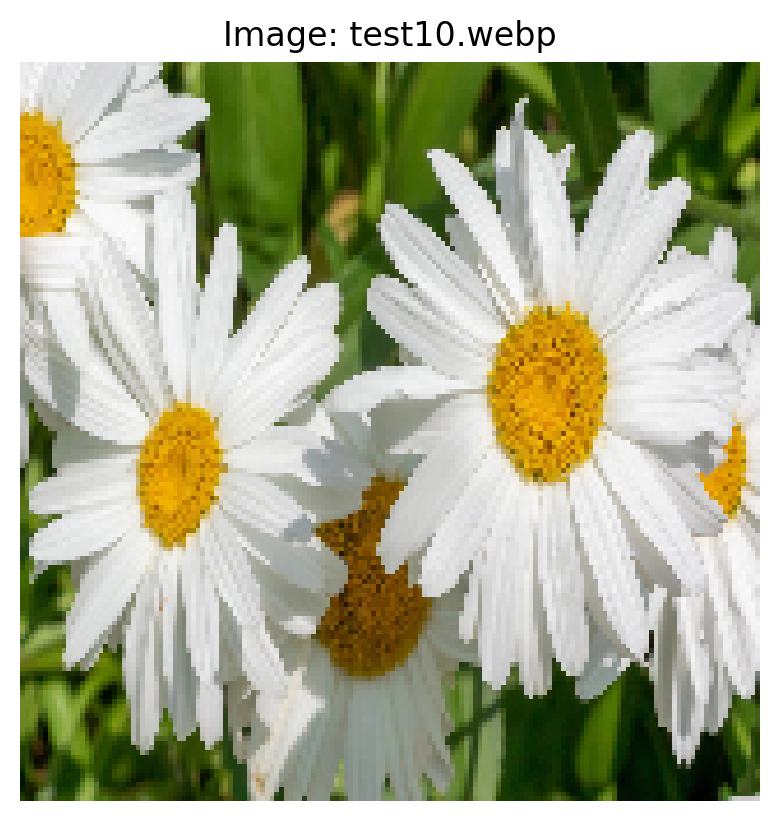

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step

This image seems to be:
dandelion : 0.00%
daisy     : 99.99%
tulips    : 0.00%
sunflowers: 0.00%
roses     : 0.00%

✅ 최종 예측: DAISY (99.99%)


In [68]:
show_and_predict_flower('/content', 'test10.')

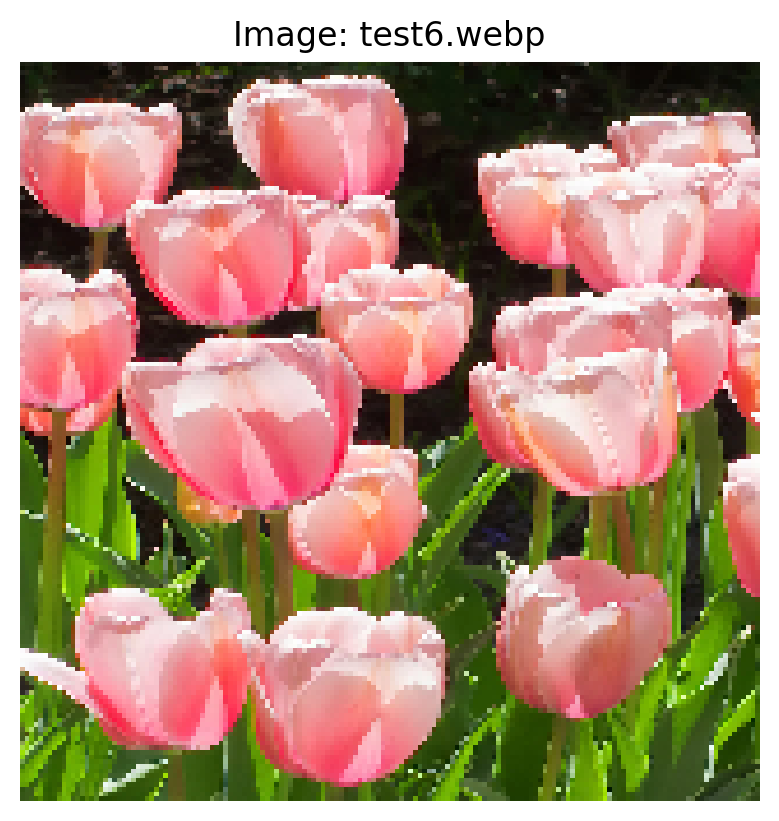

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step

This image seems to be:
dandelion : 2.17%
daisy     : 0.55%
tulips    : 96.93%
sunflowers: 0.01%
roses     : 0.34%

✅ 최종 예측: TULIPS (96.93%)


In [70]:
show_and_predict_flower('/content', 'test6.webp')